In [40]:
from scipy.io import loadmat
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import NMF
from time import time

Dataset consists of 400 faces, each face has 10304 features.


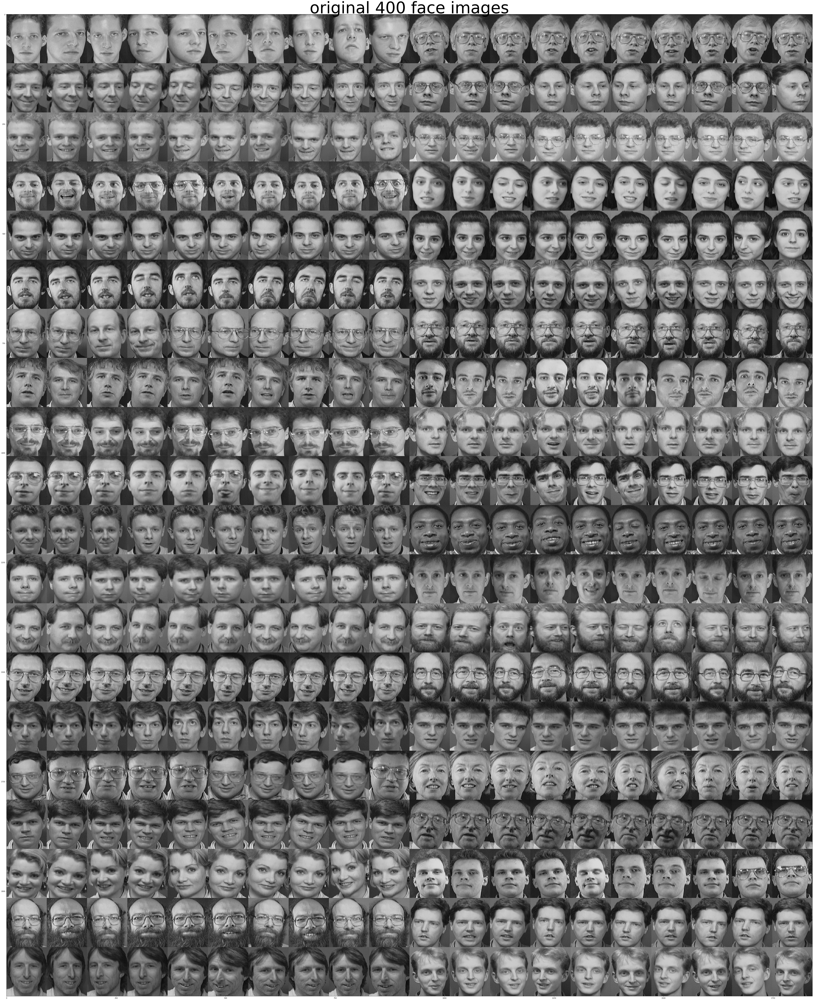

In [61]:
# This will load the matrix V
V = loadmat('attfaces.mat')['V']
print ("Dataset consists of %d faces, each face has %d features." % (V.shape[1], V.shape[0]) )
plot_gallery('original 400 face images',V)

In [60]:
# visualisation
def plot_gallery(title, vect):

    height = 112
    width = 92

    numVisualize = int(np.sqrt(vect.shape[1])) #must be a square
    V_visual = np.zeros([height*numVisualize, width*numVisualize])
    
    ix = 0
    ix1 = 0
    for i in range(numVisualize):
        ix2 = 0
        for j in range(numVisualize):
            curV = vect[:,ix]
            curV = np.reshape(np.uint8(curV),[height, width],order='F')
            V_visual[ix1:(ix1+height), ix2:(ix2+width)] = curV
            ix2 = ix2 + width
            ix = ix+1
        ix1 = ix1 + height

    plt.figure(figsize=[92,112])
    plt.title(title, size=100)
    plt.imshow(V_visual,cmap=plt.cm.gray,vmax=255, vmin=0)
    plt.show()

NMF training done in 0.646s


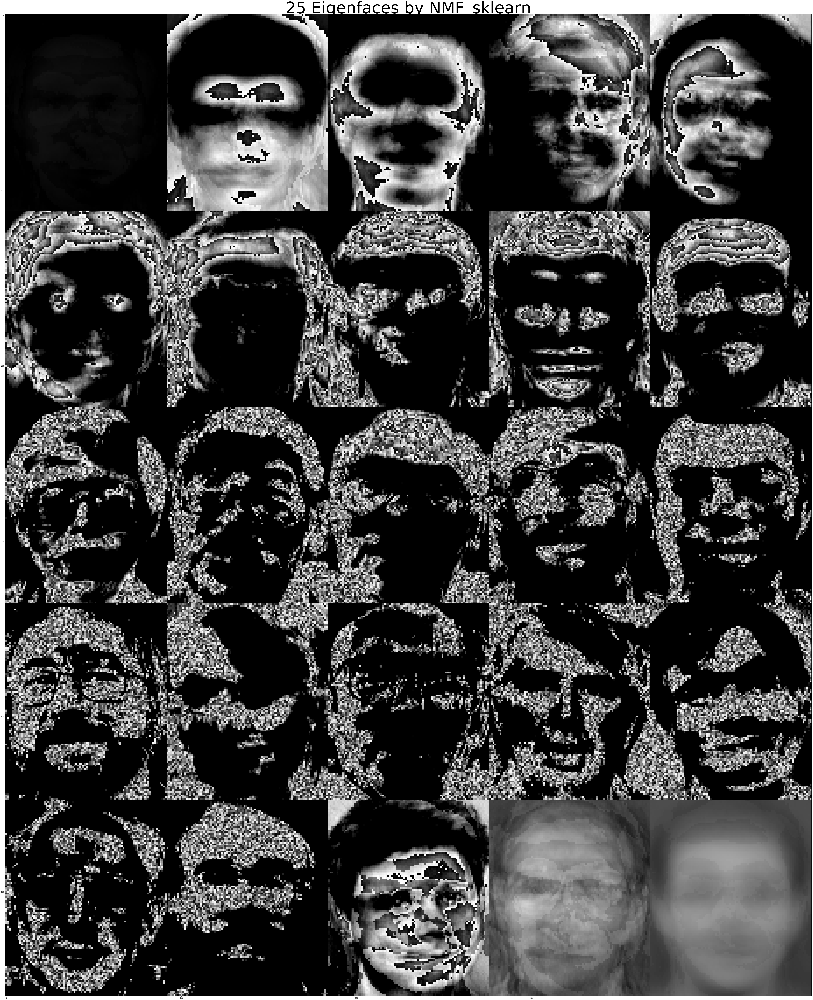

In [62]:
K = 25
nmf_sklearn = NMF(n_components=K, init='nndsvda', tol=5e-3)

t0 = time()    
fit_data = nmf_sklearn.fit_transform(np.transpose(V))
train_time = (time() - t0)

print ("NMF training done in %0.3fs" % train_time)

W = np.transpose(nmf_sklearn.components_)

plot_gallery('25 Eigenfaces by NMF_sklearn', W )